<a href="https://colab.research.google.com/github/25mb0036-droid/Decision-Tree/blob/main/MachineLearning1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from google.colab import files
uploaded = files.upload()

# Set text size
matplotlib.rcParams['font.size'] = 18
sns.set_context('talk', font_scale=1.2);

Saving melb_data.csv to melb_data.csv


In [3]:
df = pd.read_csv('melb_data.csv')
df.fillna(10,inplace=True)
df.columns = ['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount']
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,10.0,10.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,10.0,10.0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [4]:
df.describe()


,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.648380,558.416127,84.538243,1191.015022,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,1.114612,3990.669241,398.362601,956.358521,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,10.000000,10.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,51.000000,1925.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,129.940000,1975.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


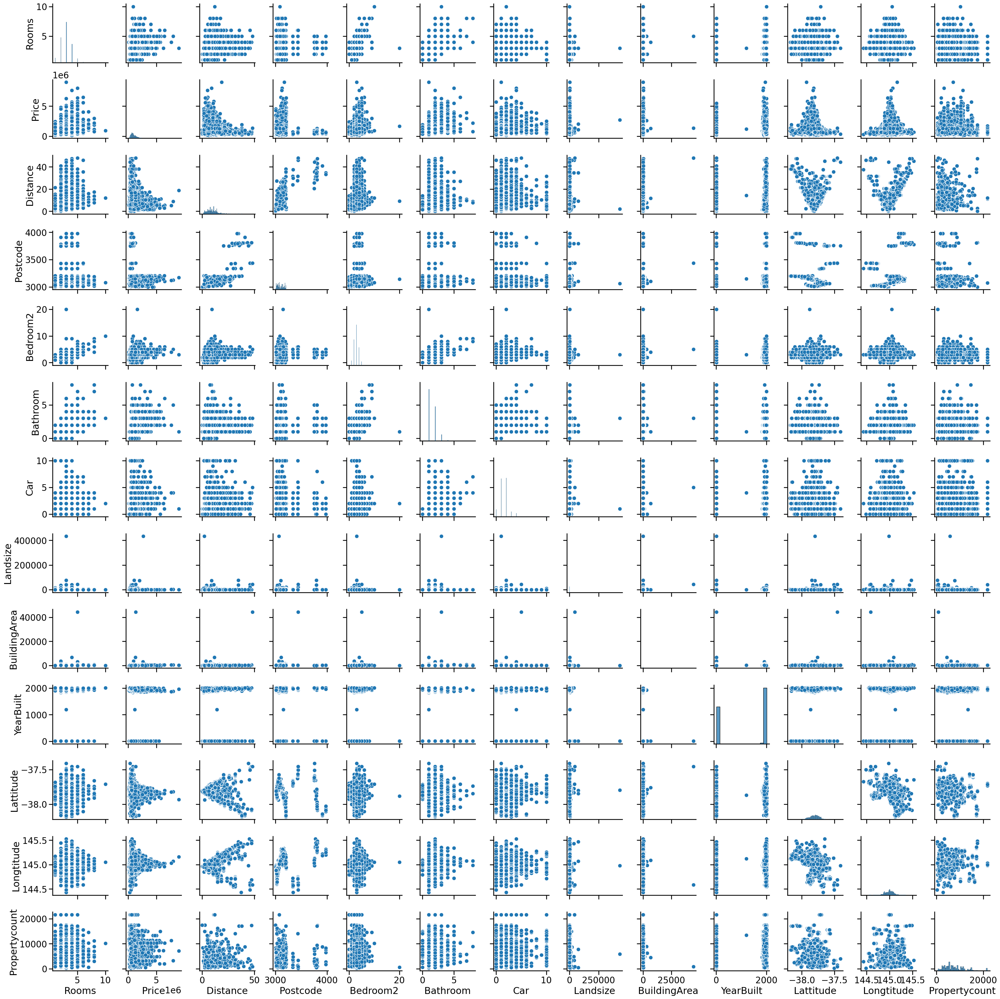

In [5]:
sns.pairplot(df);

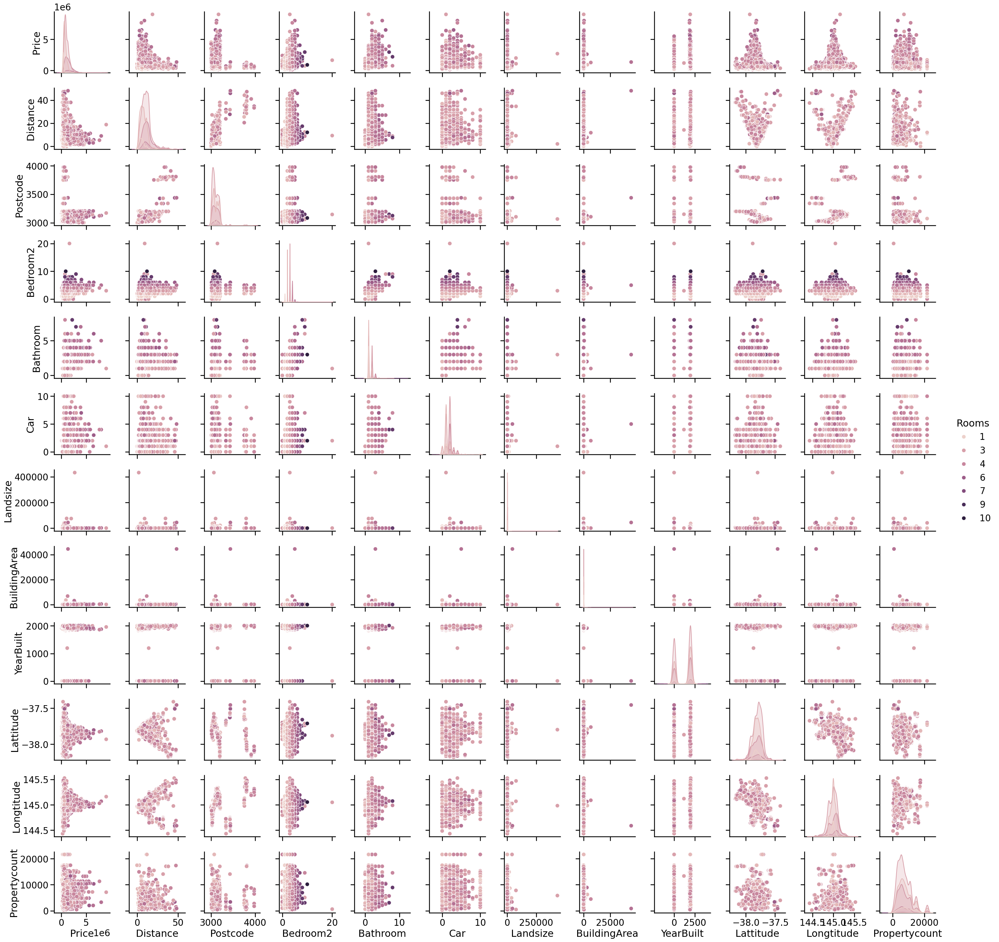

In [7]:
df.columns
matplotlib.rcParams['font.size'] = 40
sns.pairplot(df, hue = 'Rooms');



/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


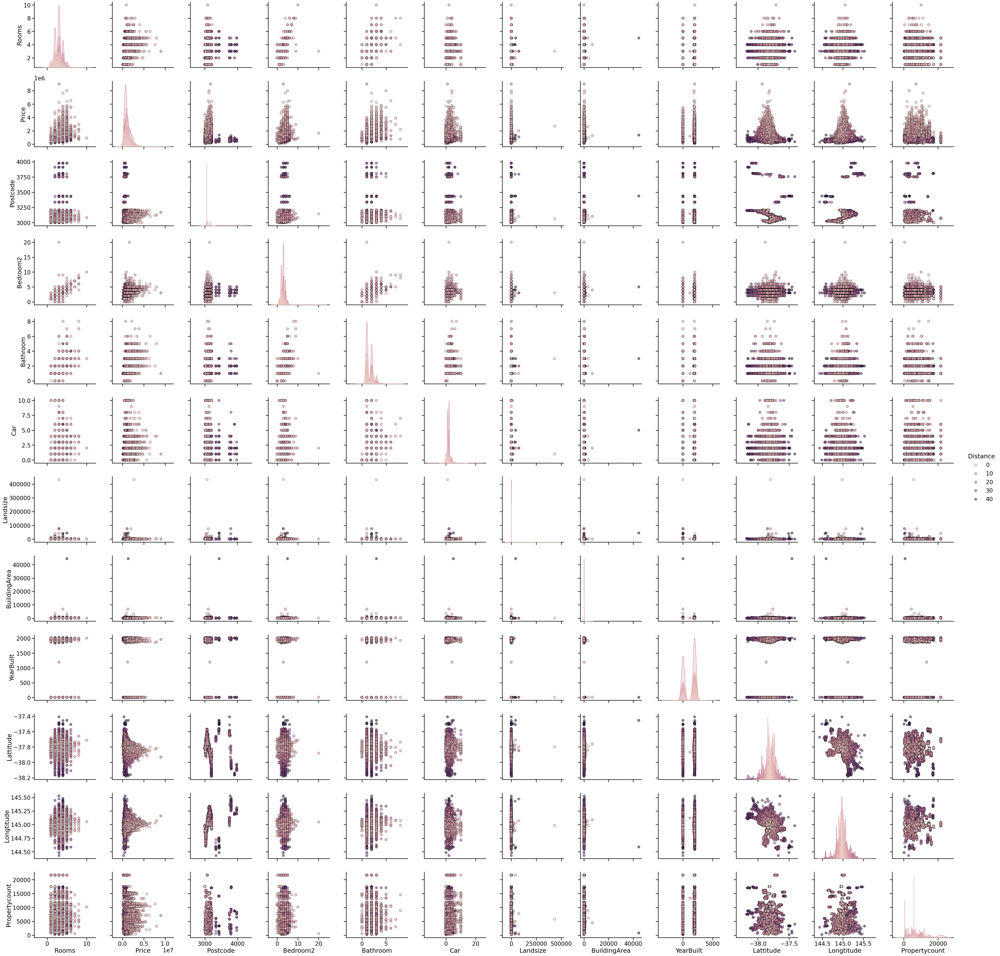

In [8]:
sns.pairplot(df, hue = 'Distance', diag_kind = 'kde', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'}, size = 4);
#Location matters greatly, but so does proximity to a key point (the low 'Distance' area). The most valuable properties are those located in specific, high-demand neighborhoods that also happen to be close to the reference point used to calculate the 'Distance' variable.
#Prices are lower for higher distances.
#

In [20]:
#df['Postcode'] = pd.cut(df['Postcode'], bins = range(0, 5000, 10))

df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,"(3060, 3070]",...,1.0,1.0,202.0,10.0,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,"(3060, 3070]",...,1.0,0.0,156.0,79.0,NaN,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,"(3060, 3070]",...,2.0,0.0,134.0,150.0,NaN,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,"(3060, 3070]",...,2.0,1.0,94.0,10.0,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,"(3060, 3070]",...,1.0,2.0,120.0,142.0,NaN,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


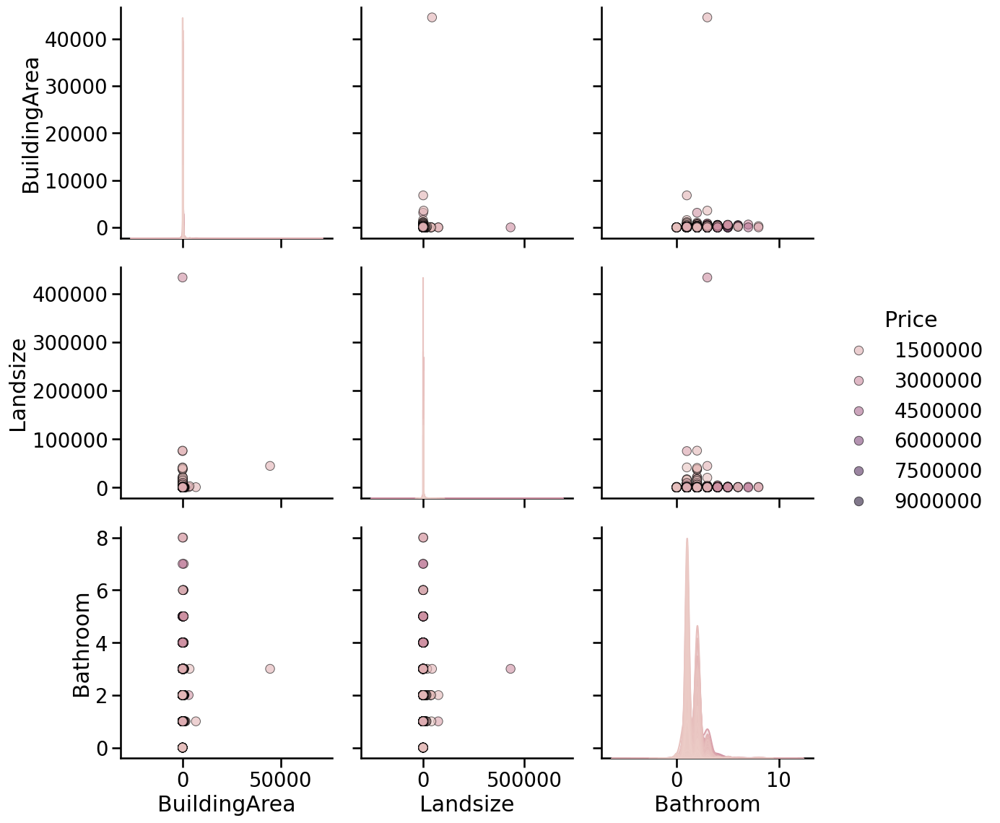

In [26]:
sns.pairplot(df, hue = 'Price', diag_kind = 'kde', vars = ['BuildingArea', 'Landsize', 'Bathroom'],
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'}, size = 4);

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


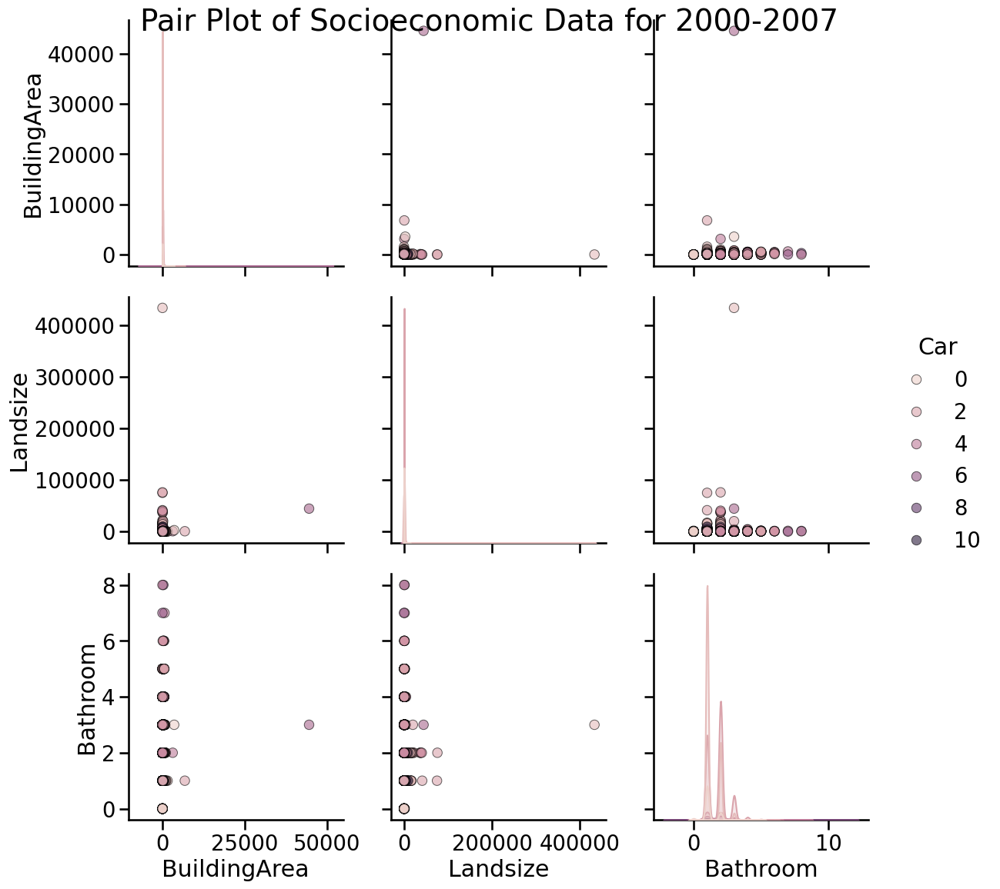

In [29]:
sns.pairplot(df[df['Price'] >= 100000], vars = ['BuildingArea', 'Landsize', 'Bathroom'],
             hue = 'Car', diag_kind = 'kde', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'}, size = 4);
plt.suptitle('Pair Plot of Socioeconomic Data for 2000-2007', size = 28);

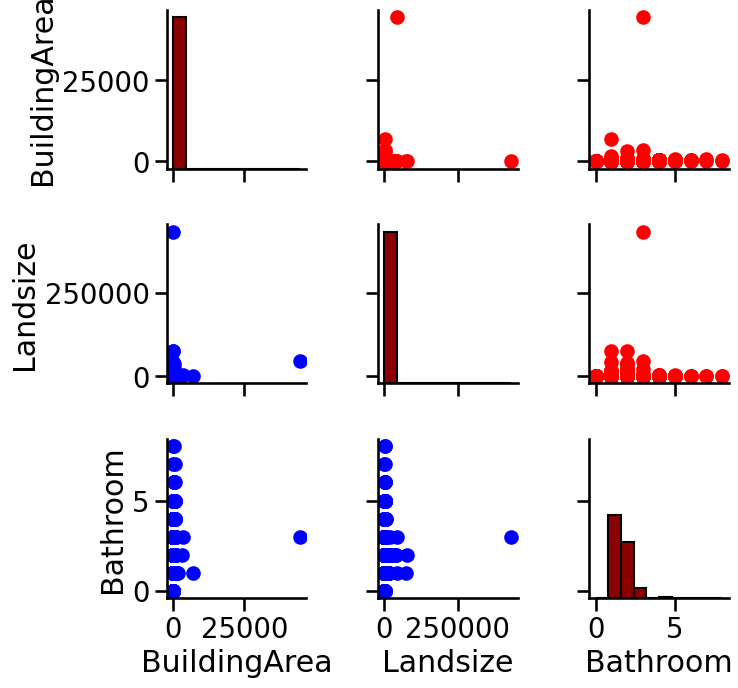

In [42]:
grid = sns.PairGrid(df[df['Distance']>2] , vars = ['BuildingArea', 'Landsize', 'Bathroom'])
grid = grid.map_upper(plt.scatter ,color= 'red')
grid = grid.map_lower(plt.scatter, color="blue")
grid =grid.map_diag(plt.hist,bins=10, color="darkred", edgecolor='k')

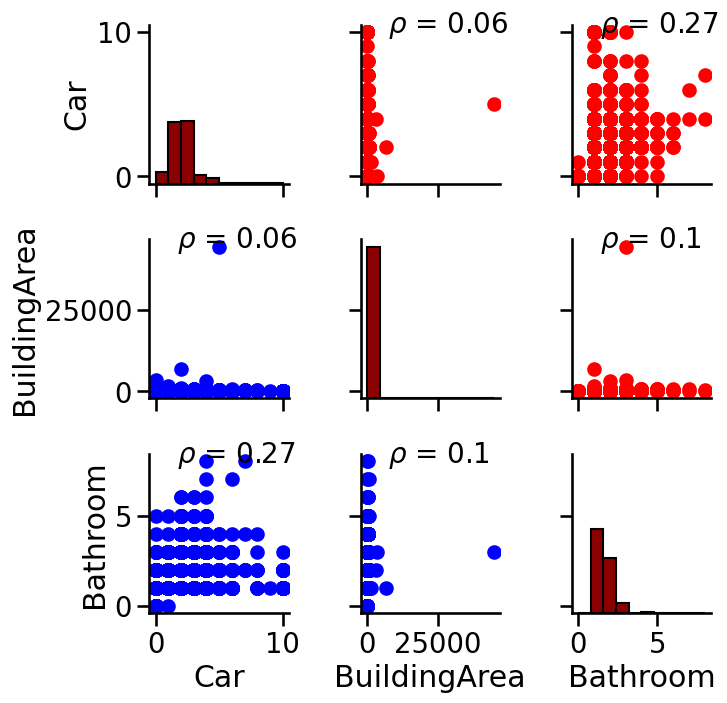

In [62]:
# Function to calculate correlation coefficient between two arrays
def corr(x,y,**kwargs):
 # Calculate the value
  coef =np.corrcoef(x,y)[0][1]

  label = r'$\rho$ = ' + str(round(coef, 2))
  ax = plt.gca()
  ax.annotate(label, xy = (0.2, 0.95), size = 20, xycoords = ax.transAxes)

grid = sns.PairGrid(df[df['Price']>0] , vars = ['Car', 'BuildingArea', 'Bathroom'])
grid = grid.map_upper(plt.scatter ,color= 'red')
grid = grid.map_upper(corr)
grid = grid.map_lower(plt.scatter, color="blue")
grid = grid.map_lower(corr)
grid =grid.map_diag(plt.hist,bins=10, color="darkred", edgecolor='k')

mean     2.0
std      1.0
min      0.0
50%      2.0
max     10.0
Name: life_exp stats, dtype: float64
mean       85.0
std       398.0
min         0.0
50%        51.0
max     44515.0
Name: life_exp stats, dtype: float64
mean    2.0
std     1.0
min     0.0
50%     1.0
max     8.0
Name: life_exp stats, dtype: float64


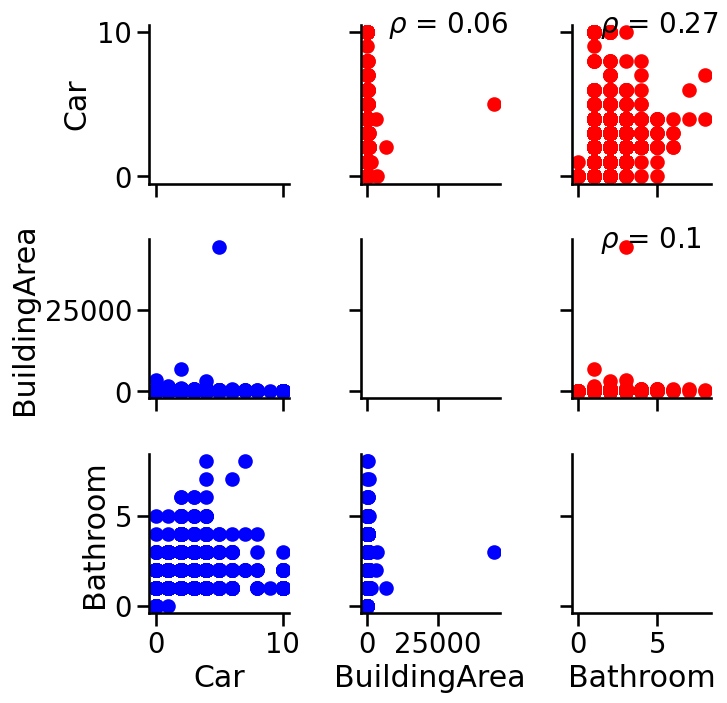

In [68]:
def summary(x,**kwargs):
  x = pd.Series(x)
  label = x.describe()[['mean', 'std', 'min', '50%', 'max']]

  ax= plt.gca()
  if label.name == 'log_pop':
        label = 10 ** label
        label.name = 'pop stats'
  elif label.name == 'log_gdp_per_cap':
        label = 10 ** label
        label.name = 'gdp_per_cap stats'
  else:
        label.name = 'life_exp stats'
  label = label.round()
  ax = plt.gca()
  ax.set_axis_off()
  print(label)
grid = sns.PairGrid(df[df['Price']>0] , vars = ['Car', 'BuildingArea', 'Bathroom'])
grid = grid.map_upper(plt.scatter ,color= 'red')
grid = grid.map_upper(corr)
grid = grid.map_lower(plt.scatter, color="blue")

grid =grid.map_diag(summary)
